#### Bias correction of numerical prediction model temperature forecast Data Set


**Problem Stastement**: It contains fourteen numerical weather prediction (NWP)'s meteorological forecast data, two in-situ observations, and five geographical auxiliary variables over Seoul, South Korea in the summer.

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.



|Data Set Characteristics|Number of Instances|Area|Attribute Characteristics|Number of Attributes|Associated Tasks|Missing Values|
|---------|-------|-----|----|---|---|---|
|Multivariate|7750|Physical|Real|25|Regression|Yes|





#### Atttributes Information
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPSTmaxlapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPSTminlapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8

In [32]:
import numpy as np
import pandas as pd
import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns

In [33]:
Url ="http://archive.ics.uci.edu/ml/machine-learning-databases/00514/Bias_correction_ucl.csv"

In [34]:
Data = pd.read_csv(Url)

In [35]:
Data.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [36]:
Data.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8


In [37]:
Data.describe().T

,count,mean,std,min,25%,50%,75%,max
station,7750.0,13.000000,7.211568,1.000000,7.000000,13.000000,19.000000,25.000000
Present_Tmax,7682.0,29.768211,2.969999,20.000000,27.800000,29.900000,32.000000,37.600000
Present_Tmin,7682.0,23.225059,2.413961,11.300000,21.700000,23.400000,24.900000,29.900000
LDAPS_RHmin,7677.0,56.759372,14.668111,19.794666,45.963543,55.039024,67.190056,98.524734
LDAPS_RHmax,7677.0,88.374804,7.192004,58.936283,84.222862,89.793480,93.743629,100.000153
LDAPS_Tmax_lapse,7677.0,29.613447,2.947191,17.624954,27.673499,29.703426,31.710450,38.542255
LDAPS_Tmin_lapse,7677.0,23.512589,2.345347,14.272646,22.089739,23.760199,25.152909,29.619342
LDAPS_WS,7677.0,7.097875,2.183836,2.882580,5.678705,6.547470,8.032276,21.857621
LDAPS_LH,7677.0,62.505019,33.730589,-13.603212,37.266753,56.865482,84.223616,213.414006
LDAPS_CC1,7677.0,0.368774,0.262458,0.000000,0.146654,0.315697,0.575489,0.967277


In [38]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [39]:
Data.isna().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [40]:
Data[Data['station'].isna()]

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.370,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.335,5.178230,5992.895996,38.9,29.8


In [41]:
Data[Data['Date'].isna()]

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.370,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.335,5.178230,5992.895996,38.9,29.8


In [42]:
for I in Data.columns:
    print(Data[Data[I].isna()])  # all null values in the rows wise Find null Values 

      station Date  Present_Tmax  Present_Tmin  LDAPS_RHmin  LDAPS_RHmax  \
7750      NaN  NaN          20.0          11.3    19.794666    58.936283   
7751      NaN  NaN          37.6          29.9    98.524734   100.000153   

      LDAPS_Tmax_lapse  LDAPS_Tmin_lapse   LDAPS_WS    LDAPS_LH  ...  \
7750         17.624954         14.272646   2.882580  -13.603212  ...   
7751         38.542255         29.619342  21.857621  213.414006  ...   

      LDAPS_PPT2  LDAPS_PPT3  LDAPS_PPT4      lat      lon      DEM     Slope  \
7750    0.000000    0.000000    0.000000  37.4562  126.826   12.370  0.098475   
7751   21.621661   15.841235   16.655469  37.6450  127.135  212.335  5.178230   

      Solar radiation  Next_Tmax  Next_Tmin  
7750      4329.520508       17.4       11.3  
7751      5992.895996       38.9       29.8  

[2 rows x 25 columns]
      station Date  Present_Tmax  Present_Tmin  LDAPS_RHmin  LDAPS_RHmax  \
7750      NaN  NaN          20.0          11.3    19.794666    58.936283 

#### EDA

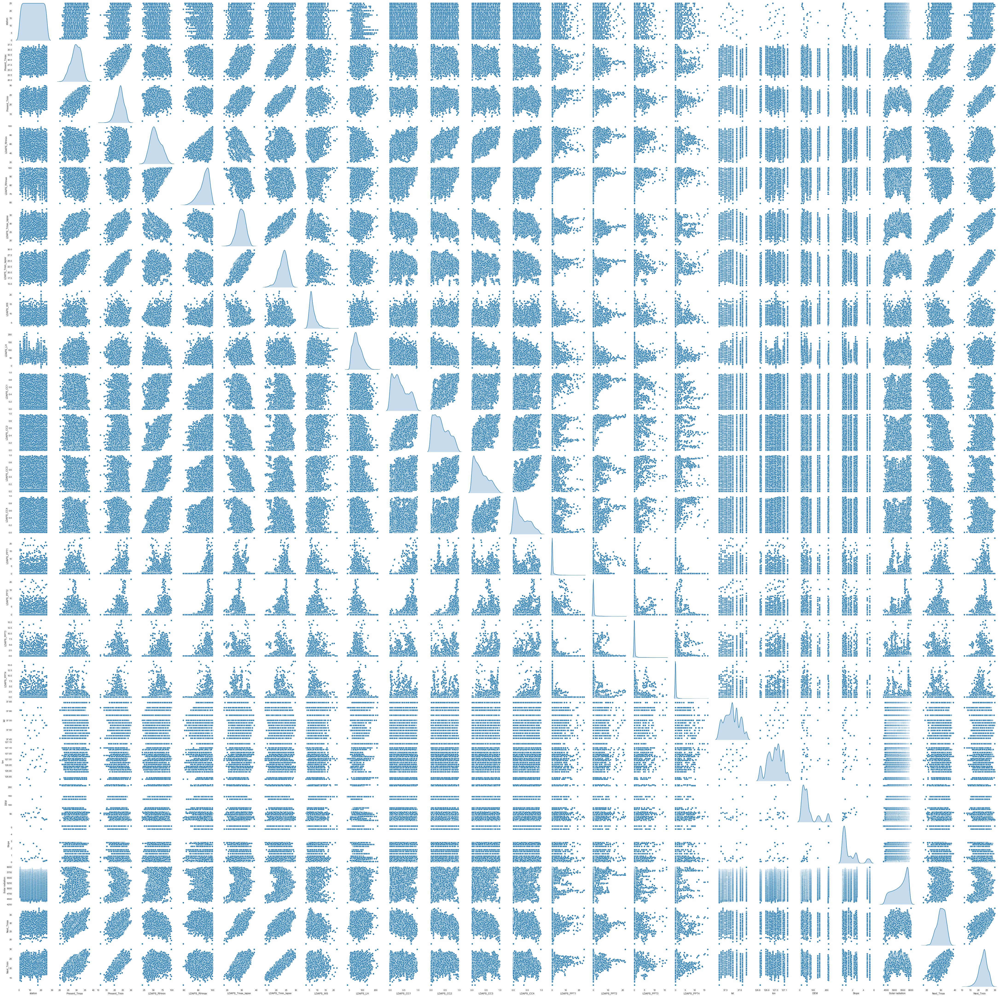

In [43]:
sns.pairplot(Data,diag_kind="kde")
plt.savefig("Pairplot.png",dpi=300)

In [ ]:
pandas_profiling.ProfileReport(Data)

In [ ]:
sns.distplot(Data.LDAPS_RHmax)

In [ ]:
plot = Data.drop('Date',axis=1)

In [ ]:
for I in plot.columns:
    sns.distplot(plot[I])
    plt.show()

In [ ]:
for I in Data.columns:
    sns.boxplot(Data[I])

In [53]:
Data.dropna(axis=1,how='all',inplace=True)

In [55]:
Max = Data[['Present_Tmax','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_WS','LDAPS_LH','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4','LDAPS_PPT1','LDAPS_PPT4',
          'lat','lon','DEM','Slope','Solar radiation','Next_Tmax']]

In [56]:
Max.head()

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
0,28.7,91.116364,28.074101,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1
1,31.9,90.604721,29.850689,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5
2,31.6,83.973587,30.091292,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1
3,32.0,96.483688,29.704629,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7
4,31.4,90.155128,29.113934,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2


In [57]:
Max.tail()

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
7747,23.3,78.869858,26.352081,6.148918,72.058294,0.030034,0.081035,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3
7748,23.3,77.294975,27.010193,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6
7749,23.2,77.243744,27.939516,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8
7750,20.0,58.936283,17.624954,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4
7751,37.6,100.000153,38.542255,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9


In [58]:
Max.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Present_Tmax      7682 non-null   float64
 1   LDAPS_RHmax       7677 non-null   float64
 2   LDAPS_Tmax_lapse  7677 non-null   float64
 3   LDAPS_WS          7677 non-null   float64
 4   LDAPS_LH          7677 non-null   float64
 5   LDAPS_CC1         7677 non-null   float64
 6   LDAPS_CC2         7677 non-null   float64
 7   LDAPS_CC3         7677 non-null   float64
 8   LDAPS_CC4         7677 non-null   float64
 9   LDAPS_PPT1        7677 non-null   float64
 10  LDAPS_PPT4        7677 non-null   float64
 11  lat               7752 non-null   float64
 12  lon               7752 non-null   float64
 13  DEM               7752 non-null   float64
 14  Slope             7752 non-null   float64
 15  Solar radiation   7752 non-null   float64
 16  Next_Tmax         7725 non-null   float64


In [59]:
Max.describe()

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
count,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000
mean,29.768211,88.374804,29.613447,7.097875,62.505019,0.368774,0.356080,0.318404,0.299191,0.591995,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887
std,2.969999,7.192004,2.947191,2.183836,33.730589,0.262458,0.258061,0.250362,0.254348,1.945768,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010
min,20.000000,58.936283,17.624954,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000
25%,27.800000,84.222862,27.673499,5.678705,37.266753,0.146654,0.140615,0.101388,0.081532,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000
50%,29.900000,89.793480,29.703426,6.547470,56.865482,0.315697,0.312421,0.262555,0.227664,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000
75%,32.000000,93.743629,31.710450,8.032276,84.223616,0.575489,0.558694,0.496703,0.499489,0.052525,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000
max,37.600000,100.000153,38.542255,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000


In [61]:
Feature = Max.drop(['Next_Tmax'],axis=1)
Feature.head(2)

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,28.7,91.116364,28.074101,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996
1,31.9,90.604721,29.850689,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500


In [82]:
Feature.replace(np.NaN,0,inplace=True)

In [83]:
Feature.isna().sum()

Present_Tmax        0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
dtype: int64

In [62]:
Target = Max['Next_Tmax']

In [87]:
Target.replace(np.NaN,0,inplace=True)

In [88]:
Target.isna().sum()

0

## Before Scaling 

In [89]:
from sklearn.model_selection import train_test_split

In [173]:
x_train,x_test,y_train,y_test = train_test_split(Feature,Target,test_size=0.1)

In [174]:
x_train.shape

(6976, 16)

In [175]:
y_train.shape

(6976,)

In [176]:
from sklearn.linear_model import LinearRegression

In [177]:
lm = LinearRegression()

In [178]:
lm.fit(x_train,y_train)

LinearRegression()

In [179]:
lm.coef_

array([ 2.31410172e-01, -9.15156636e-02,  3.58973826e-01, -2.67466926e-01,
        6.35897476e-03, -1.03130614e+00,  4.74482200e-01, -1.71510611e+00,
       -1.39785936e+00,  1.11027350e-01,  8.08137639e-02,  1.36756175e+00,
       -2.04060355e+00, -6.09879838e-03,  3.03961888e-01,  7.60342110e-04])

In [180]:
lm.intercept_

227.12116757079949

In [181]:
Train_score = lm.score(x_train,y_train)
Train_score

0.5380816591558073

In [182]:
predict = lm.predict(x_test)

In [183]:
Test_score = lm.score(x_test,predict)
Test_score # overfitting

1.0

### After Scalling

In [139]:
from sklearn.preprocessing import StandardScaler

In [140]:
ss = StandardScaler()

In [141]:
Scaled_Data = ss.fit_transform(Feature)

In [142]:
pd.DataFrame(Scaled_Data,columns=Feature.columns)

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-0.195796,0.320347,-0.303829,-0.092185,0.221336,-0.497849,-0.573957,-0.611878,-0.649048,-0.302656,-0.222227,1.189286,-0.005000,2.772243,1.115004,1.517935
1,0.587970,0.274775,0.127016,-0.586164,-0.292012,-0.529859,-0.389214,-0.620851,-0.661611,-0.302656,-0.222227,1.189286,0.511177,-0.315157,-0.542158,1.229950
2,0.514492,-0.315859,0.185366,-0.390529,-1.211307,-0.591169,-0.367227,-0.443025,-0.605101,-0.302656,-0.222227,0.653021,0.838510,-0.526218,-0.723133,1.216534
3,0.612462,0.798413,0.091595,-0.604503,0.112166,-0.564511,-0.488652,-0.614027,-0.636015,-0.302656,-0.222227,1.991696,0.385280,-0.297588,0.932424,1.201176
4,0.465506,0.234730,-0.051656,-0.567266,1.350178,-0.810917,-0.396068,-0.543390,-0.495614,-0.302656,-0.222227,0.118743,1.807917,-0.494322,-0.548433,1.207205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,-1.518401,-0.770447,-0.721441,-0.385842,0.297732,-1.271272,-1.048052,-1.255899,-1.162922,-0.302656,-0.222227,-0.149390,-1.263971,-0.852681,-0.803915,-2.093040
7748,-1.518401,-0.910722,-0.561841,-0.213189,-0.429652,-1.249123,-1.071485,-1.255899,-1.162922,-0.302656,-0.222227,-0.417522,-1.037356,-0.821213,-0.755095,-2.104553
7749,-1.542893,-0.915285,-0.336468,0.113988,-1.547875,-1.199513,-1.129729,-1.255899,-1.159798,-0.302656,-0.222227,-0.417522,-0.269384,-0.779043,-0.719338,-2.074325
7750,-2.326659,-2.545926,-2.837883,-1.817526,-2.213017,-1.385188,-1.360750,-1.255899,-1.162922,-0.302656,-0.222227,-1.758184,-2.082302,-0.911963,-0.845455,-2.358212


In [143]:
lm_s = LinearRegression()

In [144]:
Sc_X_Train,Sc_X_Test,Sc_y_Train,Sc_y_Test = train_test_split(Scaled_Data,Target)

In [145]:
lm_s.fit(Sc_X_Train,Sc_y_Train)

LinearRegression()

In [146]:
lm_s.coef_

array([ 0.78854106, -1.06181397,  1.5310796 , -0.63436861,  0.25069193,
       -0.23718409,  0.12604432, -0.39415224, -0.38767911,  0.19048035,
        0.09288425,  0.04369643, -0.13991741, -0.34203442,  0.44944573,
        0.32574667])

In [147]:
lm_s.intercept_

30.166509743310385

In [148]:
S_train = lm_s.score(Sc_X_Train,Sc_y_Train)
S_train

0.5224821819339912

In [149]:
s_predication = lm_s.predict(Sc_X_Test)

In [150]:
S_test = lm_s.score(Sc_X_Test,s_predication)
S_test

1.0


<pre>
-------------------------------------------------------------------------------
Transformations: an introduction
-------------------------------------------------------------------------------
<p>
    In data analysis <b>transformation</b> is the replacement of a variable by a
    function of that variable: for example, replacing a variable x by the
    square root of x or the logarithm of x. In a stronger sense, a
    transformation is a replacement that changes the shape of a distribution
    or relationship.
<p>
    This help does not pretend to be comprehensive or even generous on
    literature citations.  Various references that I have found helpful are
    sprinkled here and there. Two that have particularly shaped my
    understanding are Emerson and Stoto (1983) and Emerson (1983). Behind
    those articles lies the persistent emphasis placed on the value of
    transformations in the work of John Wilder Tukey (1915-2000).
<p>
    This help item covers the following topics. You can read in sequence or
    skim directly to each section. Starred sections are likely to appear more
    esoteric or more difficult than the others to those new to the subject.
<p>
        Reasons for using transformations
<p>
        Review of most common transformations
<p>
        Psychological comments - for the puzzled
<p>
        How to do transformations in Stata
<p>
        * Transformations for proportions and percents
<p>
        * Transformations as a family
<p>
        * Transformations for variables that are both positive and negative
<p>
    Typographical notes:
<p>
        ^ means raise to the power of whatever follows.
<p>
        _ means that whatever follows should be considered a subscript
        (written below the line).
<p>
        The Stata notation == for "is equal to" and != for "is not equal to"
        are used for tests of various true-or-false conditions.
<p>
<p>
<b><u>Reasons for using transformations</u></b>
<p>
    There are many reasons for transformation. The list here is not
    comprehensive.
<p>
        1. Convenience
        2. Reducing skewness
        3. Equal spreads
        4. Linear relationships
        5. Additive relationships
<p>
    If you are looking at just one variable, 1, 2 and 3 are relevant, while
    if you are looking at two or more variables, 4 and 5 are more important.
    However, transformations that achieve 4 and 5 very often achieve 2 and 3.
<p>
    1. <b>Convenience</b> A transformed scale may be as natural as the original
    scale and more convenient for a specific purpose (e.g.  percentages
    rather than original data, sines rather than degrees).
<p>
    One important example is <b>standardisation</b>, whereby values are adjusted for
    differing level and spread. In general
<p>
                             value - level
        standardised value = -------------.
                                spread
<p>
    Standardised values have level 0 and spread 1 and have no units: hence
    standardisation is useful for comparing variables expressed in different
    units. Most commonly a <b>standard score</b> is calculated using the mean and
    standard deviation (sd) of a variable:
<p>
            x - mean of x
        z = -------------.
               sd of x
<p>
    Standardisation makes no difference to the shape of a distribution.
<p>
    2. <b>Reducing skewness</b> A transformation may be used to reduce skewness.  A
    distribution that is symmetric or nearly so is often easier to handle and
    interpret than a skewed distribution. More specifically, a normal or
    Gaussian distribution is often regarded as ideal as it is assumed by many
    statistical methods.
<p>
    To reduce right skewness, take roots or logarithms or reciprocals (roots
    are weakest). This is the commonest problem in practice.
<p>
    To reduce left skewness, take squares or cubes or higher powers.
<p>
    3. <b>Equal spreads</b> A transformation may be used to produce approximately
    equal spreads, despite marked variations in level, which again makes data
    easier to handle and interpret. Each data set or subset having about the
    same spread or variability is a condition called <b>homoscedasticity</b>: its
    opposite is called <b>heteroscedasticity</b>.  (The spelling <b>-sked-</b> rather than
    <b>-sced-</b> is also used.)
<p>
    4.  <b>Linear relationships</b> When looking at relationships between variables,
    it is often far easier to think about patterns that are approximately
    linear than about patterns that are highly curved. This is vitally
    important when using linear regression, which amounts to fitting such
    patterns to data. (In Stata, regress is the basic command for
    regression.)
<p>
    For example, a plot of logarithms of a series of values against time has
    the property that periods with <b>constant rates of change</b> (growth or
    decline) plot as straight lines.
<p>
    5. <b>Additive relationships</b> Relationships are often easier to analyse when
    additive rather than (say) multiplicative. So
<p>
        y = a + bx
<p>
    in which two terms a and bx are added is easier to deal with than
<p>
        y = ax^b
<p>
    in which two terms a and x^b are multiplied. <b>Additivity</b> is a vital issue
    in <b>analysis of variance</b> (in Stata, anova, oneway, etc.).
<p>
    In practice, a transformation often works, serendipitously, to do several
    of these at once, particularly to reduce skewness, to produce nearly
    equal spreads and to produce a nearly linear or additive relationship.
    But this is not guaranteed.
<p>
<p>
<b><u>Review of most common transformations</u></b> 
<p>
    The most useful transformations in introductory data analysis are the
    reciprocal, logarithm, cube root, square root, and square. In what
    follows, even when it is not emphasised, it is supposed that
    transformations are used only over ranges on which they yield (finite)
    real numbers as results.
<p>
    <i>Reciprocal</i>
<p>
    The <b>reciprocal</b>, x to 1/x, with its sibling the <b>negative reciprocal</b>, x to
    -1/x, is a very strong transformation with a drastic effect on
    distribution shape. It can not be applied to zero values.  Although it
    can be applied to negative values, it is not useful unless all values are
    positive. The reciprocal of a ratio may often be interpreted as easily as
    the ratio itself: e.g.
<p>
        population density (people per unit area) becomes area per person;
<p>
        persons per doctor becomes doctors per person;
<p>
        rates of erosion become time to erode a unit depth.
<p>
    (In practice, we might want to multiply or divide the results of taking
    the reciprocal by some constant, such as 1000 or 10000, to get numbers
    that are easy to manage, but that itself has no effect on skewness or
    linearity.)
<p>
    The reciprocal reverses order among values of the same sign: largest
    becomes smallest, etc. The negative reciprocal preserves order among
    values of the same sign.
<p>
    <i>Logarithm</i>
<p>
    The <b>logarithm</b>, x to log base 10 of x, or x to log base e of x (ln x), or
    x to log base 2 of x, is a strong transformation with a major effect on
    distribution shape. It is commonly used for reducing right skewness and
    is often appropriate for measured variables. It can not be applied to
    zero or negative values. One unit on a logarithmic scale means a
    multiplication by the base of logarithms being used. Exponential growth
    or decline
<p>
        y = a exp(bx)
<p>
    is made linear by
<p>
        ln y = ln a + bx
<p>
    so that the response variable y should be logged. (Here exp() means
    raising to the power e, approximately 2.71828, that is the base of
    natural logarithms.)
<p>
    An aside on this <b>exponential growth or decline</b> equation: put x = 0, and
<p>
        y = a exp(0) = a,
<p>
    so that a is the amount or count when x = 0. If a and b &gt; 0, then y grows
    at a faster and faster rate (e.g. compound interest or unchecked
    population growth), whereas if a &gt; 0 and b &lt; 0, y declines at a slower
    and slower rate (e.g. radioactive decay).
<p>
    Power functions y = ax^b are made linear by log y = log a + b log x so
    that both variables y and x should be logged.
<p>
    An aside on such <b>power functions</b>: put x = 0, and for b &gt; 0,
<p>
        y = ax^b = 0,
                 
    so the power function for positive b goes through the origin, which often
    makes physical or biological or economic sense. Think: does zero for x
    imply zero for y? This kind of power function is a shape that fits many
    data sets rather well.
<p>
    Consider ratios y = p / q where p and q are both positive in practice.
    Examples are
<p>
        males / females;
        dependants / workers;
        downstream length / downvalley length. 
<p>
    Then y is somewhere between 0 and infinity, or in the last case, between
    1 and infinity. If p = q, then y = 1. Such definitions often lead to
    skewed data, because there is a clear lower limit and no clear upper
    limit. The logarithm, however, namely
<p>
        log y = log p / q = log p - log q,
<p>
    is somewhere between -infinity and infinity and p = q means that log y =
    0. Hence the logarithm of such a ratio is likely to be more symmetrically
    distributed.
<p>
    <i>Cube root</i> 
<p>
    The <b>cube root</b>, x to x^(1/3). This is a fairly strong transformation with
    a substantial effect on distribution shape: it is weaker than the
    logarithm. It is also used for reducing right skewness, and has the
    advantage that it can be applied to zero and negative values.  Note that
    the cube root of a volume has the units of a length. It is commonly
    applied to rainfall data.
<p>
    Applicability to negative values requires a special note. Consider
    (2)(2)(2) = 8 and (-2)(-2)(-2) = -8. These examples show that the cube
    root of a negative number has negative sign and the same absolute value
    as the cube root of the equivalent positive number. A similar property is
    possessed by any other root whose power is the reciprocal of an odd
    positive integer (powers 1/3, 1/5, 1/7, etc.).
<p>
    This property is a little delicate. For example, change the power just a
    smidgen from 1/3, and we can no longer define the result as a product of
    precisely three terms. However, the property is there to be exploited if
    useful.
<p>
    <i>Square root</i>
<p>
    The <b>square root</b>, x to x^(1/2) = sqrt(x), is a transformation with a
    moderate effect on distribution shape: it is weaker than the logarithm
    and the cube root. It is also used for reducing right skewness, and also
    has the advantage that it can be applied to zero values. Note that the
    square root of an area has the units of a length. It is commonly applied
    to counted data, especially if the values are mostly rather small.
<p>
    <i>Square</i> 
<p>
    The <b>square</b>, x to x^2, has a moderate effect on distribution shape and it
    could be used to reduce left skewness. In practice, the main reason for
    using it is to fit a response by a quadratic function y = a + b x + c
    x^2. Quadratics have a turning point, either a maximum or a minimum,
    although the turning point in a function fitted to data might be far
    beyond the limits of the observations. The distance of a body from an
    origin is a quadratic if that body is moving under constant acceleration,
    which gives a very clear physical justification for using a quadratic.
    Otherwise quadratics are typically used solely because they can mimic a
    relationship within the data region. Outside that region they may behave
    very poorly, because they take on arbitrarily large values for extreme
    values of x, and unless the intercept a is constrained to be 0, they may
    behave unrealistically close to the origin.
<p>
    Squaring usually makes sense only if the variable concerned is zero or
    positive, given that (-x)^2 and x^2 are identical.
<p>
    <i>Which transformation?</i> 
<p>
    The main criterion in choosing a transformation is: what works with the
    data? As examples above indicate, it is important to consider as well two
    questions.
<p>
    What makes physical (biological, economic, whatever) sense, for example
    in terms of limiting behaviour as values get very small or very large?
    This question often leads to the use of logarithms.
<p>
    Can we keep dimensions and units simple and convenient? If possible, we
    prefer measurement scales that are easy to think about. The cube root of
    a volume and the square root of an area both have the dimensions of
    length, so far from complicating matters, such transformations may
    simplify them. Reciprocals usually have simple units, as mentioned
    earlier. Often, however, somewhat complicated units are a sacrifice that
    has to be made.
<p>
<p>
<b><u>Psychological comments </u></b>-<b><u> for the puzzled</u></b>
<p>
    The main motive for transformation is greater ease of description.
    Although transformed scales may seem less natural, this is largely a
    psychological objection. Greater experience with transformation tends to
    reduce this feeling, simply because transformation so often works so
    well. In fact, many familiar measured scales are really transformed
    scales: decibels, pH and the Richter scale of earthquake magnitude are
    all logarithmic.
<p>
    However, transformations cause debate even among experienced data
    analysts.  Some use them routinely, others much less. Various views,
    extreme or not so extreme, are slightly caricatured here to stimulate
    reflection or discussion. For what it is worth, I consider all these
    views defensible, or at least understandable.
<p>
    "This seems like a kind of cheating. You don't like how the data are, so
    you decide to change them."
<p>
    "I see that this is a clever trick that works nicely. But how do I know
    when this trick will work with some other data, or if another trick is
    needed, or if no transformation is needed?"
<p>
    "Transformations are needed because there is no guarantee that the world
    works on the scales it happens to be measured on."
<p>
    "Transformations are most appropriate when they match a scientific view
    of how a variable behaves."
<p>
    Often it helps to transform results back again, using the reverse or
    <b>inverse</b> transformation:
<p>
        reciprocal   t = 1 / x            reciprocal       x = 1 / t
<p>
        log base 10  t = log_10 x         10 to the power  x = 10^t
<p>
        log base e   t = log_e x = ln x   e to the power   x = exp(t)
<p>
        log base 2   t = log_2 x          2 to the power   x = 2^t 
       
        cube root    t = x^(1/3)          cube             x = t^3
<p>
        square root  t = x^(1/2)          square           x = t^2
<p>
<p>
<b><u>How to do transformations in Stata</u></b>
<p>
    <i>Basic first steps</i>
<p>
    1. Draw a graph of the data to see how far patterns in data match the
    simplest ideal patterns. Try dotplot or scatter as appropriate.
<p>
    2. See what range the data cover. Transformations will have little effect
    if the range is small.
<p>
    3. Think carefully about data sets including zero or negative values.
    Some transformations are not defined mathematically for some values, and
    often they make little or no scientific sense. For example, I would never
    transform temperatures in degrees Celsius or Fahrenheit for these reasons
    (unless to Kelvin).
<p>
    Standard scores (mean 0 and sd 1) in a new variable are obtained by
<p>
        <b>. egen stdpopi = std(popi)</b>
<p>
    whereas the basic transformations can all be put in new variables by 
    generate:
<p>
        <b>. gen recener = 1/energy</b>
        <b>. gen logeener = ln(energy)</b>
        <b>. gen l10ener = log10(energy)</b>
        <b>. gen curtener = energy^(1/3)</b>
        <b>. gen sqrtener = sqrt(energy)</b>
        <b>. gen sqener = energy^2</b>
<p>
        <b>. gen logitp = logit(p)</b>               if p is a proportion
        <b>. gen logitp = logit(p / 100)</b>         if p is a percent
        <b>. gen frootp = sqrt(p) - sqrt(1-p)</b>    if p is a proportion
        <b>. gen frootp = sqrt(p) - sqrt(100-p)</b>  if p is a percent
<p>
<p>
    Cube roots of negative numbers require special care. Stata uses a general
    routine to calculate powers and does not look for special cases of
    powers. Whenever negative values are present, a more general recipe for
    cube roots is <b>sign(x) * (abs(x)^(1/3))</b>. Similar comments apply to fifth,
    seventh, roots etc.
<p>
    Note any messages about missing values carefully: unless you had missing
    values in the original variable, they indicate an attempt to apply a
    transformation when it is not defined. (Do you have zero or negative
    values, for example?)
<p>
    It is not always necessary to create a transformed variable before
    working with it. In particular, many graph commands allow the options
    <b>yscale(log)</b> and <b>xscale(log)</b>. This is very useful because the graph is
    labelled using the original values, but it does not leave behind a
    log-transformed variable in memory.
<p>
    <i>Other commands</i>
<p>
    Stata offers various other commands designed to help you choose a
    transformation. ladder, gladder and qladder try several transformations
    of a variable with the aim of showing how far they produce a more nearly
    normal (Gaussian) distribution.  In practice such commands can be
    helpful, or they can be confusing at an introductory level: for examples,
    they can suggest a transform at odds with what your scientific knowledge
    would indicate. boxcox and lnskew0 are more advanced commands that should
    be used only after studying textbook explanations of what they do. Box
    and Cox (1964) is the key original reference.
<p>
    For some statistical people any debate about transformation is largely
    side-stepped by the advent of <b>generalised linear models</b>. In such models,
    estimation is carried out on a transformed scale using a specified link
    function, but results are reported on the original scale of the response.
    The Stata command is glm.
<p>
<p>
<b><u>Transformations for proportions and percents (more advanced)</u></b>
<p>
    Data that are proportions (between 0 and 1) or percents (between 0 and
    100) often benefit from special transformations. The most common is the
    <b>logit</b> (or logistic) transformation, which is
<p>
        logit p = log (p / (1 - p)) for proportions
<p>
        OR logit p = log (p / (100 - p)) for percents
<p>
    where p is a proportion or percent.
<p>
    This transformation treats very small and very large values
    symmetrically, pulling out the tails and pulling in the middle around 0.5
    or 50%. The plot of p against logit p is thus a flattened S-shape.
    Strictly, logit p cannot be determined for the extreme values of 0 and 1
    (100%): if they occur in data, there needs to be some adjustment.
<p>
    One justification for this logit transformation might be sketched in
    terms of a diffusion process such as the spread of literacy. The push
    from zero to a few percent might take a fair time; once literacy starts
    spreading its increase becomes more rapid and then in turn slows; and
    finally the last few percent may be very slow in converting to literacy,
    as we are left with the isolated and the awkward, who are the slowest to
    pick up any new thing. The resulting curve is thus a flattened S-shape
    against time, which in turn is made more nearly linear by taking logits
    of literacy. More formally, the same idea might be justified by imagining
    that adoption (infection, whatever) is proportional to the number of
    contacts between those who do and those who do not, which will rise and
    then fall quadratically. More generally, there are many relationships in
    which predicted values cannot logically be less than 0 or more than 1
    (100%). Using logits is one way of ensuring this:  otherwise models may
    produce absurd predictions.
<p>
    The logit (looking only at the case of proportions)
<p>
        logit p = log (p / (1 - p))
<p>
    can be rewritten
<p>
        logit p = log p  - log (1 - p)
<p>
    and in this form it can be seen as a member of a set of <b>folded</b>
    <b>transformations</b>
<p>
        transform of p = something done to p - something done to (1 - p).
<p>
    This way of writing it brings out the symmetrical way in which very high
    and very low values are treated. (If p is small, 1 - p is large, and vice
    versa.) The logit is occasionally called the <b>folded log</b>. The simplest
    other such transformation is the <b>folded root</b> (that means square root)
<p>
        folded root of p = root of p  - root of (1 - p). 
<p>
    As with square roots and logarithms generally, the folded root has the
    advantage that it can be applied without adjustment to data values of 0
    and 1 (100%). The folded root is a weaker transformation than the logit.
    In practice it is used far less frequently.
<p>
    Two other transformations for proportions and percents met in the older
    literature (and still used occasionally) are the <b>angular</b> and the <b>probit</b>.
    The angular is
<p>
        arcsin(root of p)
<p>
    or the angle whose sine is the square root of p. In practice, it behaves
    very like
<p>
        p^0.41 - (1 - p)^0.41,
<p>
    which in turn is close to
<p>
        p^0.5 - (1 - p)^0.5,
<p>
    which is another way of writing the folded root (Tukey 1960). The probit
    is a transformation with a mathematical connection to the normal
    (Gaussian) distribution, which is not only very similar in behaviour to
    the logit, but also more awkward to work with. As a result, it is now
    less seen, except in more advanced applications, where it retains several
    advantages.
<p>
<p>
<b><u>Transformations as a family (more advanced)</u></b> 
<p>
    The main transformations mentioned previously, with the exception of the
    logarithm, namely the reciprocal, cube root, square root and square, are
    all powers. The powers concerned are
<p>
        reciprocal  -1
        cube root    1/3
        square root  1/2 
        square       2 
<p>
    Note that the sequence of explanation was not capricious, but in
    numerical order of power. Therefore, these transformations are all
    members of a family. In addition, contrary to what may appear at first
    sight, the logarithm really belongs in the family too. Knowing this is
    important to appreciating that the transformations used in practice are
    not just a bag of tricks, but a series of tools of different sizes or
    strengths, like a set of screwdrivers or drill bits. We could thus fill
    out this sequence, the ladder of transformations as it is sometimes
    known, with more powers, as for example in
<p>
        reciprocal square -2
        reciprocal        -1
        (yields one)       0 
        cube root          1/3
        square root        1/2 
        identity           1 
        square             2 
        cube               3 
        fourth power       4 
<p>
    Among the additions here, the identity transformation, say x^1 = x, is
    the transformation that is, in a sense, no transformation. The graph of x
    against x is naturally a straight line and so the power of 1 divides
    transformations whose graph is convex upwards (powers less than 1) from
    transformations whose graph is concave upwards (powers greater than 1).
    Powers less than 1 squeeze high values together and stretch low values
    apart, and powers more than 1 do the opposite.
<p>
    The transformation x^0, on the other hand, is degenerate, as it always
    yields 1 as a result. However, we will now see that in a strong sense log
    x (meaning, strictly, the natural logarithm or ln x) really belongs in
    the family at the position of power 0.
<p>
    If you know calculus, you will know that the sequence of powers
<p>
        ..., x^-3, x^-2, x^-1, x^0, x^1, x^2, ... 
<p>
    has as integrals, apart from additive constants,
<p>
        ..., -x^-2 / 2, -x^-1, ln x, x, x^2 / 2, x^3 / 3, ... 
<p>
    and the mapping can be reversed by differentiation. So integrating x^(p -
    1) yields x^p / p, unless p is 0, in which case it yields ln x.  Thus we
    can define a family
<p>
        t_p(x) = x^p      if p != 0, 
               = ln x     if p == 0. 
<p>
    The notion of choosing from a family when we choose a power or logarithm
    is a key idea. It follows that we can usually choose a different member
    of the family if the transformation turns out to be too weak, or too
    strong, for our purpose and our data.
<p>
    Many discussions of transformations focus on slightly different families,
    for a variety of mathematical and statistical reasons.  The canonical
    reference here is Box and Cox (1964), although note also earlier work by
    Tukey (1957). Most commonly, the definition is changed to
<p>
        t_p(x) = (x^p - 1) / p  if p != 0,
               = ln x           if p == 0. 
                
    This t(x, p) has various properties which point up family resemblances.
<p>
    1. ln x is the limit as p -&gt; 0 of (x^p - 1) / p.
<p>
    2. At x = 1, t_p(x) = 0, for all p.
<p>
    3. The first derivative (rate of change) of t_p(x) is x^(p - 1) if p != 0
    and 1 / x if p == 0. At x = 1, this is always 1.
<p>
    4. The second derivative of t_p(x) is (p - 1) x^(p - 2) if p != 0 and -1
    / x^2 if p == 0. At x = 1, this is always (p - 1).
<p>
    Another small change of definition has some similar consequences, but
    also some other advantages. Consider
<p>
        t_p(x) = [(x + 1)^p - 1] / p     if p != 0, 
               = ln(x + 1)               if p == 0. 
<p>
    This t(x, p) has various properties which also point up family
    resemblances.
<p>
    1. If p = 1, t_p(x) = x.
<p>
    2. At x = 0, t_p(x) = 0, for all p. So all curves start at the origin.
<p>
    3. The first derivative (rate of change) of t_p(x) is (x + 1)^(p - 1) if
    p != 0 and 1 / (x + 1) if p == 0. At x = 0, this is always 1. So the
    curves have the same slope at the origin.
<p>
    4. The second derivative of t_p(x) is (p - 1) (x + 1)^(p - 2) if p != 0
    and -1 / (x + 1)^2 if p == 0. At x = 0, this is always (p - 1).
<p>
    The most useful consequence, however, is that this definition can be
    extended more easily to variables that can be both positive and negative,
    as will now be seen.
<p>
<p>
<b><u>Transformations for variables that are both positive and negative (more advance</u></b>
<b><u>&gt; d)</u></b>
<p>
    Most of the literature on transformations focuses on one or both of two
    related situations: the variable concerned is strictly positive; or it is
    zero or positive. If the first situation does not hold, some
    transformations do not yield real number results (notably, logarithms and
    reciprocals); if the second situation does not hold, then some other
    transformations do not yield real number results or more generally do not
    appear useful (notably, square roots or squares).
<p>
    However, in some situations response variables in particular can be both
    positive and negative. This is common whenever the response is a balance,
    change, difference or derivative. Although such variables are often skew,
    the most awkward property that may invite transformation is heavy (long
    or fat) tails, high kurtosis in one terminology.  Zero usually has a
    strong substantive meaning, so that we wish to preserve the distinction
    between negative, zero and positive values. (Note that Celsius or
    Fahrenheit temperatures do not really qualify here, as their zero points
    are statistically arbitrary, for all the importance of whether water
    melts or freezes.)
<p>
    In these circumstances, experience with right-skewed and strictly
    positive variables might suggest looking for a transformation that
    behaves like ln x when x is positive and like -ln(-x) when x is negative.
    This still leaves the problem of what to do with zeros. In addition, it
    is clear from any sketch that (in Stata terms)
<p>
        <b>cond(x &lt;= 0, -ln(-x), ln(x))</b>
<p>
    would be useless. One way forward is to use
<p>
        -ln(-x + 1)    if x &lt;= 0, 
        ln(x + 1)     if x &gt; 0.  
<p>
    This can also be written
<p>
        sign(x) ln(|x| + 1)
<p>
    where sign(x) is 1 if x &gt; 0, 0 if x == 0 and -1 if x &lt; 0.  This function
    passes through the origin, behaves like x for small x, positive and
    negative, and like sign(x) ln(abs(x)) for large |x|.  The gradient is
    steepest at 1 at x = 0, so the transformation pulls in extreme values
    relative to those near the origin.  It has recently been dubbed the
    neglog transformation (Whittaker et al. 2005).  An earlier reference is
    John and Draper (1980).  In Stata language, this could be
<p>
        <b>cond(x &lt;= 0, -ln(-x + 1), ln(x + 1))</b>
<p>
    or
<p>
        <b>sign(x) * ln(abs(x) + 1)</b> 
<p>
    The inverse transformation is
<p>
        <b>cond(t &lt;= 0, 1 - exp(-t), exp(t) - 1)</b>
<p>
    A suitable generalisation of powers other than 0 is
<p>
        -[(-x + 1)^p - 1] / p    if x &lt;= 0, 
          [(x + 1)^p - 1] / p    if x &gt; 0. 
<p>
    Transformations that affect skewness as well as heavy tails in variables
    that are both positive and negative were discussed by Yeo and Johnson
    (2000).
<p>
    Another possibility in this terrain is to apply the inverse hyperbolic
    function arsinh (also known as arg sinh, sinh^-1 and arcsinh).  This is
    the inverse of the sinh function, which in turn is defined as
<p>
        sinh(x) = (exp(x) - exp(-x)) / 2. 
<p>
    The sinh and arsinh functions can be computed in Mata as <b>sinh(x)</b> and
    <b>asinh(x)</b> and in Stata as <b>(exp(x) - exp(-x))/2</b> and <b>ln(x + sqrt(x^2 + 1))</b>.
<p>
    The arsinh function also too passes through the origin and is steepest at
    the origin.  For large |x| it behaves like sign(x) ln(|2x|).  So in
    practice neglog(x) and arsinh(x) have loosely similar effects. See also
    Johnson (1949).
<p>
<p>
<b><u>Acknowledgements</u></b> 
<p>
    Austin Nichols pointed out that cube roots are well defined for negative
    values.
<p>
<p>
<b><u>Author</u></b> 
<p>
    Nicholas J. Cox, Durham University
    n.j.cox@durham.ac.uk
<p>
    (last major revision 29 November 2005; corrections and minor revisions 8
    November 2006, 25 July 2007)
<p>
<p>
<b><u>Postscript</u></b>
<p>
    I came across the following in a text on calculus.
<p>
        Transformation of a function into a form in which it can readily be
        integrated can be effected by suitable algebraical substitutions in
        which the independent variable is changed. The forms these take will
        depend on the kind of function to be integrated and, in general,
        experience and experiment must guide the student. The general aim
        will be to simplify the function so that it may become easier to
        integrate. (Abbott 1940, p.184)
<p>
    Modulo some small changes in terminology, this applies here too.  Either
    way, the advice that "experience and experiment must guide the student"
    is not much comfort to the beginner looking for guidance!
<p>
<p>
<b><u>References</u></b> 
<p>
    Abbott, P. 1940.  <i>Teach Yourself Calculus.</i>  London: English Universities
        Press.
<p>
    Box, G.E.P. and D.R. Cox. 1964.  An analysis of transformations.  <i>Journal</i>
        <i>of the Royal Statistical Society B</i> 26: 211-252.
<p>
    Emerson, J.D. 1983.  Mathematical aspects of transformation.  In Hoaglin,
        D.C., F. Mosteller and J.W. Tukey (eds) <i>Understanding Robust and</i>
        <i>Exploratory Data Analysis.</i>  New York: John Wiley, 247-282.
<p>
    Emerson, J.D. and M.A. Stoto. 1983.  Transforming data.  In Hoaglin,
        D.C., F. Mosteller and J.W. Tukey (eds) <i>Understanding Robust and</i>
        <i>Exploratory Data Analysis.</i>  New York: John Wiley, 97-128.
<p>
    John, J.A. and N.R. Draper. 1980.  An alternative family of
        transformations.  <i>Applied Statistics</i> 29: 190-197.
<p>
    Johnson, N.L. 1949.  Systems of frequency curves generated by methods of
        translation.  <i>Biometrika</i> 36: 149-176.
<p>
    Tukey, J.W. 1957.  On the comparative anatomy of transformations.  <i>Annals</i>
        <i>of Mathematical Statistics</i> 28: 602-632.
<p>
    Tukey, J. W. 1960.  The practical relationship between the common
        transformations of percentages or fractions and of amounts. Reprinted
        in Mallows, C.L. (ed.) 1990.  <i>The Collected Works of John W. Tukey.</i>
        <i>Volume VI: More Mathematical.</i>  Pacific Grove, CA: Wadsworth &amp;
        Brooks-Cole, 211-219.
<p>
    Whittaker, J., J. Whitehead and M. Somers. 2005.  The neglog
        transformation and quantile regression for the analysis of a large
        credit scoring database.  <i>Applied Statistics</i> 54: 863-878.
<p>
    Yeo, I. and R.A. Johnson. 2000.  A new family of power transformations to
        improve normality or symmetry.  <i>Biometrika</i> 87: 954-959.
<p>
<p>
<b><u>Also see</u></b>
<p>
    On-line: generate, egen, graph
<p>
</pre>

![](https://miro.medium.com/max/3666/1*6LP6ONJmeGMdjIwseCIBGw.jpeg)

In [185]:
np.log(Feature)  # Negative Skew

c:\users\reddy\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log
  """Entry point for launching an IPython kernel.
c:\users\reddy\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log
  """Entry point for launching an IPython kernel.


,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,3.356897,4.512137,3.334847,1.919696,4.240633,-1.452659,-1.590147,-1.822032,-2.033106,-inf,-inf,3.627126,4.844116,5.358165,1.024248,8.698330
1,3.462606,4.506506,3.396208,1.739042,3.950040,-1.489399,-1.379234,-1.836062,-2.057858,-inf,-inf,3.627126,4.844439,3.801369,-0.665337,8.677493
2,3.453157,4.430502,3.404236,1.814535,3.023982,-1.563778,-1.356854,-1.589187,-1.951047,-inf,-inf,3.626408,4.844644,3.505762,-1.323883,8.676511
3,3.465736,4.569374,3.391303,1.731664,4.185512,-1.530756,-1.487210,-1.825374,-2.008061,-inf,-inf,3.628200,4.844360,3.822448,0.930115,8.675387
4,3.446808,4.501532,3.371217,1.746589,4.681812,-1.887784,-1.386313,-1.720970,-1.771833,-inf,-inf,3.625692,4.845250,3.556433,-0.682207,8.675828
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,3.148453,4.367799,3.271547,1.816276,4.277475,-3.505419,-2.512874,-inf,-inf,-inf,-inf,3.625332,4.843328,2.746476,-1.861753,8.399156
7748,3.148453,4.347629,3.296214,1.878368,3.855272,-3.327747,-2.590769,-inf,-inf,-inf,-inf,3.624973,4.843470,2.850452,-1.503727,8.398043
7749,3.144152,4.346966,3.330042,1.986403,2.207179,-3.016884,-2.815603,-inf,-7.135719,-inf,-inf,3.624973,4.843951,2.974733,-1.304530,8.400962
7750,2.995732,4.076457,2.869316,1.058686,NaN,-inf,-inf,-inf,-inf,-inf,-inf,3.623172,4.842816,2.515274,-2.317957,8.373212


In [126]:
np.log1p(Feature)   #  Removing Negative Skew

c:\users\reddy\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log1p
  """Entry point for launching an IPython kernel.


,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,3.391147,4.523053,3.369848,2.056542,4.254929,0.210218,0.185563,0.149882,0.123039,0.000000,0.000000,3.653371,4.851960,5.362864,1.331046,8.698497
1,3.493473,4.517483,3.429159,1.900896,3.969111,0.203356,0.224560,0.147941,0.120204,0.000000,0.000000,3.653371,4.852280,3.823463,0.414821,8.677663
2,3.484312,4.442340,3.436928,1.965464,3.071445,0.190078,0.229101,0.185725,0.132891,0.000000,0.000000,3.652672,4.852483,3.535344,0.235941,8.676682
3,3.496508,4.579685,3.424413,1.894624,4.200612,0.195873,0.203759,0.149417,0.125970,0.000000,0.000000,3.654417,4.852202,3.844087,1.262657,8.675558
4,3.478158,4.512563,3.404988,1.907318,4.691032,0.140985,0.223140,0.164575,0.157022,0.000000,0.000000,3.651974,4.853084,3.584574,0.409125,8.675999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,3.190476,4.380399,3.308793,1.966961,4.291258,0.029592,0.077919,0.000000,0.000000,0.000000,0.000000,3.651624,4.851178,2.808655,0.144447,8.399381
7748,3.190476,4.360483,3.332568,2.020596,3.876219,0.035245,0.072286,0.000000,0.000000,0.000000,0.000000,3.651274,4.851319,2.906661,0.200734,8.398269
7749,3.186353,4.359829,3.365208,2.114961,2.311548,0.047793,0.058145,0.000000,0.000796,0.000000,0.000000,3.651274,4.851796,3.024534,0.240040,8.401186
7750,3.044522,4.093282,2.924502,1.356500,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.649520,4.850670,2.593013,0.093922,8.373443
